<h2> Table of content </h2>
<ul> <li> <a href="#Introduction"> Introduction </a> </li>
    <li> <a href="#data_description"> Data Description</a> </li>    
    <li> <a href="#load_data"> Load Data </a> </li>
    <li> <a href="#first_look"> Preliminary look at Data </a> </li>
    <li> <a href="#eda"> Explorations Data analysis </a> </li>
    <li> <a href="missing_values"> Missing Values </a> </li> 
    <li> <a href="feature_engineering"> Feature engineering </a> </li>
    <li> <a href="feat_exploration"> Features dataset explorations </a> </li>
    <li> <a href="modeling"> Modeling </a> </li>
    <li> <a href="submission"> Submission </a> </li>
</ul>
<hr>

* <h2 id=Introduction> Introduction </h2>

The goal of this exercise is to see if we can come up with profitable trading strategies. The data provided gives the weight {'weight' column) invested in a given instrument as well as the return over an unspecified time horizon. Another column return_4 also provide the return over a different time horizon. The trading strategies developed here will not use return_4, but can easily be extended or modified to work with this or any other time horizon. The return on trade is the product of weight (always positve) with return. Hence if the return is positive, the trade is profitable. 

The goal is select trades with a positive return and reject trades with negative returns. Thus the question can be posed as a classification problem or alternatively as a regression problem where we predict the returns and would like to do the trades when the return is sufficently positive.







* <h2 id=data_description> Data Description </h2>

The data provides suggested trades: weights and returns for 500 trading days. Each data there are almost ~4K potential trading opportunities. The goal is to decide whether to execute a trade or not. The result is product of weight (always positive) and return. If the return is positive the trade will be profitable and if the return is negative the trade will be unprofitable. To determing whether to do the trade or not we are provided with 130 predictiors: tag_0 to tag_129. I downloaded the original data from Kaggle website where Jane Street is hosting a competition. 


## Import libraries:


In [1]:
import pandas as pd
import numpy as np
#import datatable as dt
from scipy import stats

# Graphing 
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns


import warnings
warnings.filterwarnings('ignore')

Install XGBoost if necessary

In [2]:
# The fo;;owomg package may need to be reinstalled]
#pip install xgboost

In [3]:
# Monitor execution time
import time
start_time = time.time()


* <h2 id=load_data> Load Data </h2>

In [4]:
# Read in training data: 
file_path = r"I:/SpringBoard_Data"
file_name = file_path + '/trade_data.csv'

train_data = pd.read_csv(file_name)
train_data.head(10)

,Unnamed: 0,date,weight,return_4,return,tag_0,tag_1,tag_2,tag_3,tag_4,...,tag_121,tag_122,tag_123,tag_124,tag_125,tag_126,tag_127,tag_128,tag_129,ts_id
0,0,0,0.000000,0.001390,0.006270,1,-1.872746,-2.191242,-0.474163,-0.323046,...,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,1,0,16.673515,-0.011114,-0.009792,-1,-1.349537,-1.704709,0.068058,0.028432,...,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,2,0,0.000000,0.034380,0.023970,-1,0.812780,-0.256156,0.806463,0.400221,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,3,0,0.000000,-0.000476,-0.003200,-1,1.174378,0.344640,0.066872,0.009357,...,NaN,2.838853,0.499251,3.033732,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,4,0,0.138531,-0.006219,-0.002604,1,-3.172026,-3.093182,-0.161518,-0.128149,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4
5,5,0,0.000000,0.004667,0.001282,-1,-1.499681,-1.928023,0.008089,-0.019485,...,NaN,0.337112,4.079450,0.613967,6.622410,0.799525,5.231833,0.360831,3.922324,5
6,6,0,0.190575,0.005963,0.000709,-1,-3.172026,-3.093182,-0.030588,-0.043175,...,NaN,0.336873,4.076447,0.614783,6.622176,0.800618,5.231595,0.361506,3.921714,6
7,7,0,3.820844,0.036970,0.033473,-1,0.446050,-0.466210,0.498751,0.244116,...,NaN,2.101997,4.846202,1.479875,5.261328,2.305066,4.571762,2.201537,4.429745,7
8,8,0,0.116557,-0.003546,-0.001677,1,-3.172026,-3.093182,-0.363836,-0.291496,...,NaN,1.537913,4.785838,1.637435,6.968002,2.354338,5.825499,1.778029,4.740577,8
9,9,0,0.160117,0.035360,0.020317,1,2.744408,1.412127,-0.250801,-0.161357,...,NaN,1.796860,3.177064,0.999252,2.906432,1.589816,2.435999,1.472419,2.245991,9


#### delete unnamed column

In [5]:
train_data.drop(columns = ['Unnamed: 0'], inplace = True)
train_data.head()

,date,weight,return_4,return,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,...,tag_121,tag_122,tag_123,tag_124,tag_125,tag_126,tag_127,tag_128,tag_129,ts_id
0,0,0.000000,0.001390,0.006270,1,-1.872746,-2.191242,-0.474163,-0.323046,0.014688,...,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,0,16.673515,-0.011114,-0.009792,-1,-1.349537,-1.704709,0.068058,0.028432,0.193794,...,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.034380,0.023970,-1,0.812780,-0.256156,0.806463,0.400221,-0.614188,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.000476,-0.003200,-1,1.174378,0.344640,0.066872,0.009357,-1.006373,...,NaN,2.838853,0.499251,3.033732,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,-0.006219,-0.002604,1,-3.172026,-3.093182,-0.161518,-0.128149,-0.195006,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


In [6]:
train_data.shape

(2390491, 135)

The data consists of 2390491 instances and 135 columns. Each instance is a possible trade if the weight column is non-zero. The columns labeled retrun_4 and return represent the return over an unspedified time period. We will only use "return" in this analysis. There are 130 predictors labeled "tag_0" to "tag_129". The date column represents a particular data and the ts_id column is the the time-series id for each potential trades:

| columns| | Description|
|--------|------|------------|
|date| | represents different trading dates|
|return| | return over unspefified time period|
|tag_0 to tag_129|| potential predictors

* <h2 id=first_look> Preliminary Data Analysis</h2>

#### Create a column 'action' which is 1 if we want to do the trade and 0 if we want to pass on the trade

In [7]:
train_data['action'] = (train_data['return'] > 0)*1
print('There are %s  trades and %s no trades'%((train_data.action==1).sum(), (train_data.action==0).sum()))

There are 1204974  trades and 1185517 no trades


#### Store column names in variable colNames

In [8]:
colNames = train_data.columns

In [9]:
colNames

Index(['date', 'weight', 'return_4', 'return', 'tag_0', 'tag_1', 'tag_2',
       'tag_3', 'tag_4', 'tag_5',
       ...
       'tag_122', 'tag_123', 'tag_124', 'tag_125', 'tag_126', 'tag_127',
       'tag_128', 'tag_129', 'ts_id', 'action'],
      dtype='object', length=136)

In [10]:
# store predictors in a list "predictors"
# get the predictors
import re
regex = re.compile('tag.')
predictors = [string for string in colNames if re.match(regex, string)]

predictors

['tag_0',
 'tag_1',
 'tag_2',
 'tag_3',
 'tag_4',
 'tag_5',
 'tag_6',
 'tag_7',
 'tag_8',
 'tag_9',
 'tag_10',
 'tag_11',
 'tag_12',
 'tag_13',
 'tag_14',
 'tag_15',
 'tag_16',
 'tag_17',
 'tag_18',
 'tag_19',
 'tag_20',
 'tag_21',
 'tag_22',
 'tag_23',
 'tag_24',
 'tag_25',
 'tag_26',
 'tag_27',
 'tag_28',
 'tag_29',
 'tag_30',
 'tag_31',
 'tag_32',
 'tag_33',
 'tag_34',
 'tag_35',
 'tag_36',
 'tag_37',
 'tag_38',
 'tag_39',
 'tag_40',
 'tag_41',
 'tag_42',
 'tag_43',
 'tag_44',
 'tag_45',
 'tag_46',
 'tag_47',
 'tag_48',
 'tag_49',
 'tag_50',
 'tag_51',
 'tag_52',
 'tag_53',
 'tag_54',
 'tag_55',
 'tag_56',
 'tag_57',
 'tag_58',
 'tag_59',
 'tag_60',
 'tag_61',
 'tag_62',
 'tag_63',
 'tag_64',
 'tag_65',
 'tag_66',
 'tag_67',
 'tag_68',
 'tag_69',
 'tag_70',
 'tag_71',
 'tag_72',
 'tag_73',
 'tag_74',
 'tag_75',
 'tag_76',
 'tag_77',
 'tag_78',
 'tag_79',
 'tag_80',
 'tag_81',
 'tag_82',
 'tag_83',
 'tag_84',
 'tag_85',
 'tag_86',
 'tag_87',
 'tag_88',
 'tag_89',
 'tag_90',
 'tag_91'

In [11]:
print(train_data.info())
train_data.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2390491 entries, 0 to 2390490
Columns: 136 entries, date to action
dtypes: float64(132), int32(1), int64(3)
memory usage: 2.4 GB
None


date          int64
weight      float64
return_4    float64
return      float64
tag_0         int64
             ...   
tag_127     float64
tag_128     float64
tag_129     float64
ts_id         int64
action        int32
Length: 136, dtype: object

* <h2 id=eda> Exploratory Data Analysis </h2>

*Attempt to use pandas_profiling package to examine predicitor vatiables*

In [12]:
# uncomment and run below if you need to pip install the pandas-profiling library
# Copied from Nasa Meteorite notebook
import sys
!{sys.executable} -m pip install -U pandas-profiling==2.9.0
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [13]:
import pandas_profiling
from pandas_profiling.utils.cache import cache_file


In [14]:
#df_predictors = train_data[['tag_0', 'tag_2', 'tag_10', 'tag_100']]
df_predictors = train_data[predictors]
#samlple
#print(df_predictors.shape)
#report = df_predictors.profile_report(sort='None',title = 'Predictor Analysis',     
#                                      correlations={
#         "pearson": {"calculate": False},
#         "spearman": {"calculate": False},
#         "kendall": {"calculate": False},
#         "phi_k": {"calculate": False},
#         "cramers": {"calculate": False},
#},
#          missing_diagrams={
#          'heatmap': False,
#          'dendrogram': False,
#      },
#                                      html={'style':{'full_width': True}},
#                                      interactions = None,
#                                      progress_bar=True)
#report
#profile.to_file(report)

In [15]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df_predictors, minimal=True)
profile.to_file("output.html")

In [16]:
#report.to_file("report.html")
profile.to_notebook_iframe()

#### Discussion of profiling report
There is one categorincal variable __tag_0__. The other variables are all numerical. The profiling package issued 41 warning. Of these 31 were for missing values which will be addressed later and the others involed skewed distributions. For example __tag_46__ 

|Quantile statistics||
|-------------------|---------|
|Minimum|	-3.555600683|
|5-th percentile|	-1.302931824|
|Q1	|-0.6067455785|
|median|	0|
|Q3|	0.8910881512|
|95-th percentile|	3.494013012|
|Maximum	|351.3602908|
|Range	|354.9158915|
|Interquartile range (IQR)|	1.49783373|

|Descriptive statistics| |
|--------------|---------|
|Standard deviation|	2.923683229|
|Coefficient of variation (CV)|	6.140697162|
|Kurtosis	|1835.429297|
|Mean	|0.4761158468|
|Median Absolute Deviation (MAD)|	0.7048301634|
|Skewness|	29.99523923|
|Sum	|1138150.647|
|Variance	|8.547923625|
|Monotocity|	Not monotonic|

This distributin is highly skewed, It would appear that the values at the upper end are wrong and we will need to decide for this and other skewed distributions what to do. Part of this decision will also be driven by the results of the model. At first glance it appears the value of tag_46 at the max end may be wrong. We will have to do this for each of the ten skewed distributions.

### Missing values

In [18]:
missing = df_predictors.isnull()
number_missing = missing.sum()
num_percentage_missing = 100*(number_missing/len(train_data))
#print('Missing Values \n', number_missing.sort_values())
mCols = []
for item, value in enumerate(num_percentage_missing):
    if value > 10:
        print(colNames[item], value)
        mCols.append(colNames[item])
print('Missing Values by Percentage \n',num_percentage_missing)
missing_table = pd.DataFrame({c:(train_data[c].isna().sum()/len(train_data))*100 for c in train_data.columns},index=["% missing values"])
missing_table

    

tag_3 16.445784568944205
tag_4 16.445784568944205
tag_13 16.546182353332433
tag_14 16.546182353332433
tag_23 16.546182353332433
tag_24 16.546182353332433
tag_68 14.700996573507283
tag_74 14.700996573507283
tag_80 14.700996573507283
tag_86 14.700996573507283
tag_92 14.700996573507283
tag_98 14.700996573507283
tag_104 14.700996573507283
tag_110 14.700996573507283
Missing Values by Percentage 
 tag_0      0.000000
tag_1      0.000000
tag_2      0.000000
tag_3      0.018741
tag_4      0.018741
             ...   
tag_125    0.672791
tag_126    0.370342
tag_127    0.370342
tag_128    0.080360
tag_129    0.080360
Length: 130, dtype: float64


,date,weight,return_4,return,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,...,tag_122,tag_123,tag_124,tag_125,tag_126,tag_127,tag_128,tag_129,ts_id,action
% missing values,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018741,0.018741,0.0,...,0.009329,0.009329,0.672791,0.672791,0.370342,0.370342,0.08036,0.08036,0.0,0.0


In [20]:
print(mCols)
df_missing = df_predictors[mCols]
df_missing.head()

['tag_3', 'tag_4', 'tag_13', 'tag_14', 'tag_23', 'tag_24', 'tag_68', 'tag_74', 'tag_80', 'tag_86', 'tag_92', 'tag_98', 'tag_104', 'tag_110']


,tag_3,tag_4,tag_13,tag_14,tag_23,tag_24,tag_68,tag_74,tag_80,tag_86,tag_92,tag_98,tag_104,tag_110
0,-0.474163,-0.323046,-2.667671,-2.001475,1.175200,0.967805,-2.054935,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.068058,0.028432,1.225838,0.789076,-0.543425,-0.547486,-2.147273,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.806463,0.400221,3.836342,2.183258,-1.157585,-0.966803,-2.077110,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.066872,0.009357,2.902176,1.799163,-1.421175,-1.487976,-2.099841,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.161518,-0.128149,1.257761,0.632336,2.502828,2.606440,-2.030502,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
# Going to try use package missingno
import missingno as msno



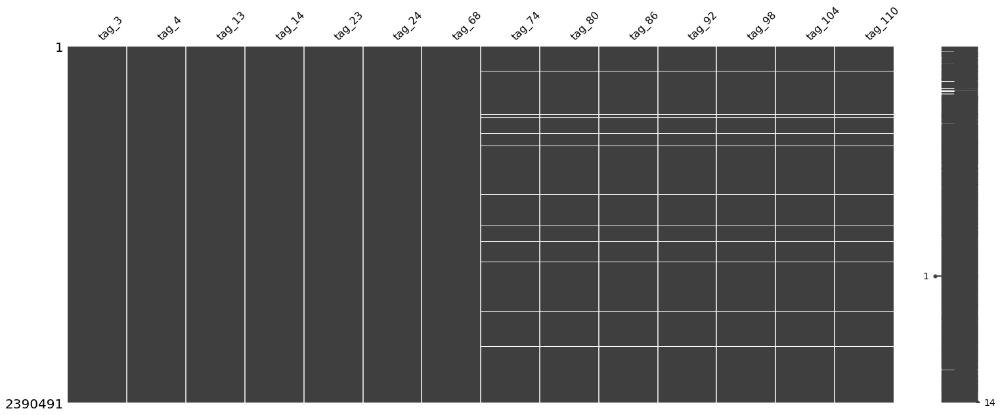

In [22]:
# let's isolate the missing 

msno.matrix(df_missing)
plt.show()

There seems to be a clear pattern in the missing data. It's difficult to figure out what to do without having some domain knowledge, but for this analysis I will delete these rows and build the classifier.

In [ ]:
#Display the returns
# create histogram
#fig, ((ax11,ax12)) = plt.subplots(1,2, figsize = (16,10))
#ax11.hist(train_data['return'], bins = 150, range = (-0.2, 0.2))
#ax12.hist(train_data['return_4'], bins = 150, range = (-0.2, 0.2));

In [ ]:
#fig,axes = plt.subplots(nrows=44,ncols=3,figsize=(25,250))

#for i, x in enumerate(predictors):
#    sns.distplot(train_data[x],ax=axes[(i-2)//3,(i-2)%3])
    
#plt.show()

There are 130 predictor:
tag_0 is a categorical variable
The other variable are mostly distributed around zero and there are definitely outliers. I will run the models with and without the outliers (defined as anything above or below a certain threshold - to be set - around the mean). Some of the predictos have double peaked distributions. Not knowing what they are are I will assume no special significance, but it's an area which needs to be explored and there may be important information hidden in the 


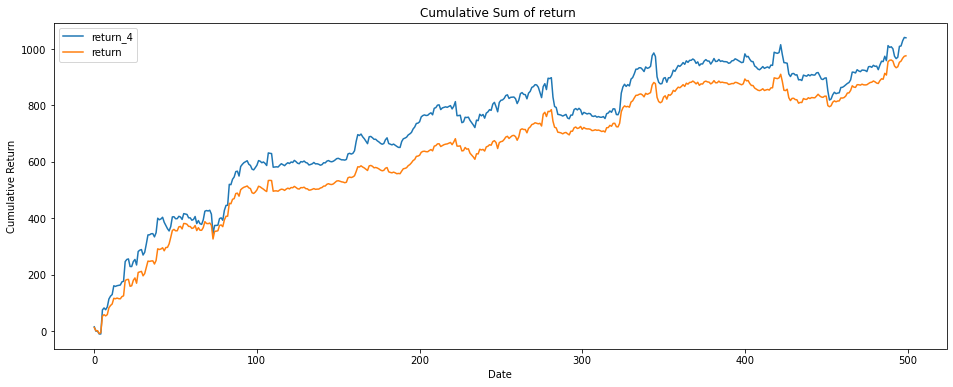

In [23]:
fig = plt.figure(figsize=(16,6))
ax = plt.subplot(1,1,1)
train_data.groupby('date')[['return_4','return']].sum().cumsum().plot(ax=ax)
plt.title('Cumulative Sum of return ')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.show()


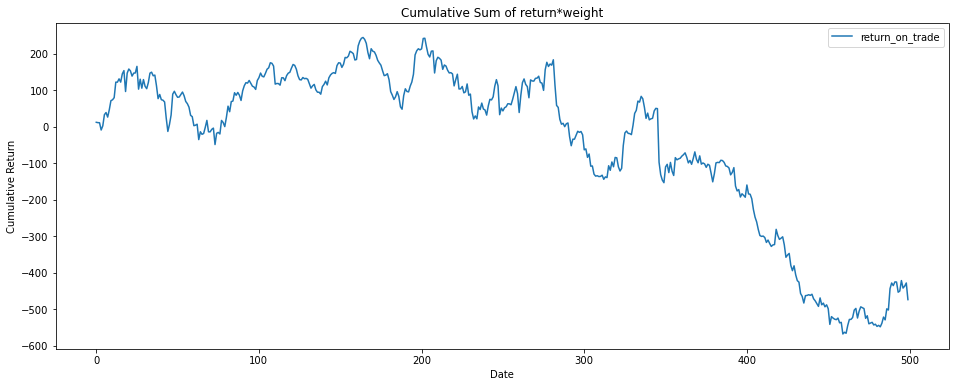

In [24]:
train_data['return_on_trade'] = train_data['weight']*train_data['return']

fig = plt.figure(figsize=(16,6))
ax = plt.subplot(1,1,1)
train_data.groupby('date')[['return_on_trade']].sum().cumsum().plot(ax=ax)
plt.title('Cumulative Sum of return*weight')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.show()


In [25]:
missing = train_data.isnull()
number_missing = missing.sum()
num_percentage_missing = 100*(number_missing/len(train_data))
#print('Missing Values \n', number_missing.sort_values())
for item, value in enumerate(num_percentage_missing):
    if value > 10:
        print(colNames[item], value)
print('Missing Values by Percentage \n',num_percentage_missing)
number_missing

tag_7 16.445784568944205
tag_8 16.445784568944205
tag_17 16.546182353332433
tag_18 16.546182353332433
tag_27 16.546182353332433
tag_28 16.546182353332433
tag_72 14.700996573507283
tag_78 14.700996573507283
tag_84 14.700996573507283
tag_90 14.700996573507283
tag_96 14.700996573507283
tag_102 14.700996573507283
tag_108 14.700996573507283
tag_114 14.700996573507283
Missing Values by Percentage 
 date               0.00000
weight             0.00000
return_4           0.00000
return             0.00000
tag_0              0.00000
                    ...   
tag_128            0.08036
tag_129            0.08036
ts_id              0.00000
action             0.00000
return_on_trade    0.00000
Length: 137, dtype: float64


date                  0
weight                0
return_4              0
return                0
tag_0                 0
                   ... 
tag_128            1921
tag_129            1921
ts_id                 0
action                0
return_on_trade       0
Length: 137, dtype: int64

In [26]:
columns_missing_data = list(train_data.columns[train_data.isnull().any()])
print(len(columns_missing_data))

88


In [27]:
for cname in colNames:
    print(cname, train_data[cname].nunique())

date 500
weight 1981288
return_4 2390259
return 2390465
tag_0 2
tag_1 1199298
tag_2 2201767
tag_3 677772
tag_4 2017784
tag_5 827749
tag_6 2031601
tag_7 1441336
tag_8 1961303
tag_9 1181984
tag_10 2357454
tag_11 1482175
tag_12 2270698
tag_13 1372363
tag_14 2334303
tag_15 1238617
tag_16 2347052
tag_17 1341391
tag_18 1908298
tag_19 1328866
tag_20 2369264
tag_21 1420517
tag_22 2245489
tag_23 1383814
tag_24 2331109
tag_25 1339724
tag_26 2356176
tag_27 1409684
tag_28 1909615
tag_29 1410751
tag_30 2370070
tag_31 1504401
tag_32 2247175
tag_33 1466920
tag_34 2332325
tag_35 1421263
tag_36 2357174
tag_37 1582105
tag_38 2117410
tag_39 1654050
tag_40 2111385
tag_41 338404
tag_42 307821
tag_43 20429
tag_44 285831
tag_45 351114
tag_46 1666676
tag_47 1661812
tag_48 1657511
tag_49 929857
tag_50 1473649
tag_51 307612
tag_52 47829
tag_53 77641
tag_54 2149416
tag_55 2322073
tag_56 2378707
tag_57 2390466
tag_58 2390375
tag_59 2388561
tag_60 719239
tag_61 722077
tag_62 712855
tag_63 715242
tag_64 2390491
tag

The above repeats some of analysis done using the profile and missingno package.

In [ ]:
# Let's look at the distribution of the various predictors
# create histogram
#fig, ((ax11,ax12)) = plt.subplots(1,2, figsize = (12,10))
#ax11.hist(train_data['return'], bins = 150, range = (-0.2, 0.2))
#ax12.hist(train_data['return_4'], bins = 150, range = (-0.2, 0.2))


#plt.show()

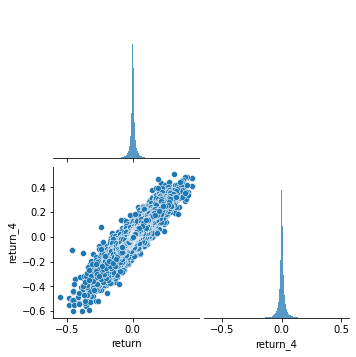

In [28]:
sns.pairplot(train_data[['return','return_4']], corner=True);

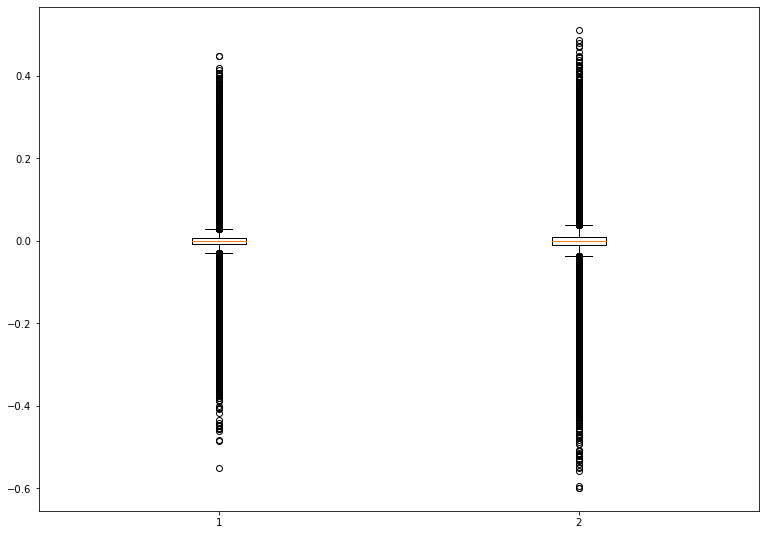

In [29]:
# Lets also do a box plot of return's
data = train_data[['return','return_4']]
fig = plt.figure(figsize = (10,7))
ax = fig.add_axes([0,0,1,1])
bp = ax.boxplot(data)
plt.show()

In [30]:
data.describe()

,return,return_4
count,2.390491e+06,2.390491e+06
mean,4.083113e-04,4.350201e-04
std,2.693609e-02,3.291224e-02
min,-5.493845e-01,-5.987447e-01
25%,-7.157903e-03,-9.310415e-03
50%,8.634997e-05,1.222579e-04
75%,7.544347e-03,9.804649e-03
max,4.484616e-01,5.113795e-01


import gc
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(20,80))
fig.suptitle('Tag Box plot with 0.1% 99.9% whiskers',fontsize=22, y=.89)
grid =  gridspec.GridSpec(29,4,figure=fig,hspace=.5,wspace=.05)
featstr = [i for i in train_data.columns[4:-2]]
counter = 0
for i in range(29):
    for j in range(4):
        subf = fig.add_subplot(grid[i, j]);
        sns.boxplot(x= train_data[featstr[counter]],saturation=.5,color= 'blue', ax= subf,width=.5,whis=(.1,99.9));
        subf.axvline(train_data[featstr[counter]].mean(),color= 'darkorange', label='Mean', linestyle=':',linewidth=3)
        subf.set_xlabel('')
        subf.set_title('{}'.format(featstr[counter]),fontsize=16)
        counter += 1
        gc.collect()
plt.show();



In [31]:
# For now let's drop all rows with null values
clean_train_data = train_data.dropna()
clean_train_data.shape


(1993372, 137)

In [32]:
tag_df = clean_train_data.iloc[:,4:-3]
tag_df.head()

,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,tag_9,...,tag_120,tag_121,tag_122,tag_123,tag_124,tag_125,tag_126,tag_127,tag_128,tag_129
479,1,0.086238,-1.370409,-0.796239,-0.344834,-1.152042,-0.504109,-2.402996,-1.680355,0.455843,...,1.635075,0.759268,0.528743,-1.237860,1.610215,0.931161,2.236798,0.563850,1.023031,-0.635663
480,-1,2.540471,1.213258,-1.147064,-0.659254,-1.125747,-0.665765,-3.051758,-2.641164,2.721408,...,4.213683,1.769695,3.047750,0.169149,3.513960,1.320900,3.726736,0.085196,3.322019,0.044636
481,1,-1.501931,-1.929721,-0.361945,-0.255800,-0.310175,-0.222479,-0.553447,-0.582370,-2.764325,...,-0.325481,2.948970,-0.463486,1.799423,-0.388679,2.653866,-0.716593,1.731266,-0.734133,1.272144
482,-1,-2.538125,-2.556376,0.801106,0.571915,-0.419473,-0.322196,1.090966,1.030251,-0.644898,...,0.122181,7.188442,-0.509257,3.463442,-0.083233,6.330656,-0.435629,4.287275,-0.594022,3.314273
483,-1,-2.425002,-2.544622,0.369648,0.150894,-0.293128,-0.172281,0.010301,-0.203682,-0.315943,...,0.685852,4.104185,0.616460,2.895219,0.441397,3.658603,0.552314,2.694183,0.781045,2.948364


In [33]:
tag_df.corr().style.background_gradient(cmap='coolwarm')

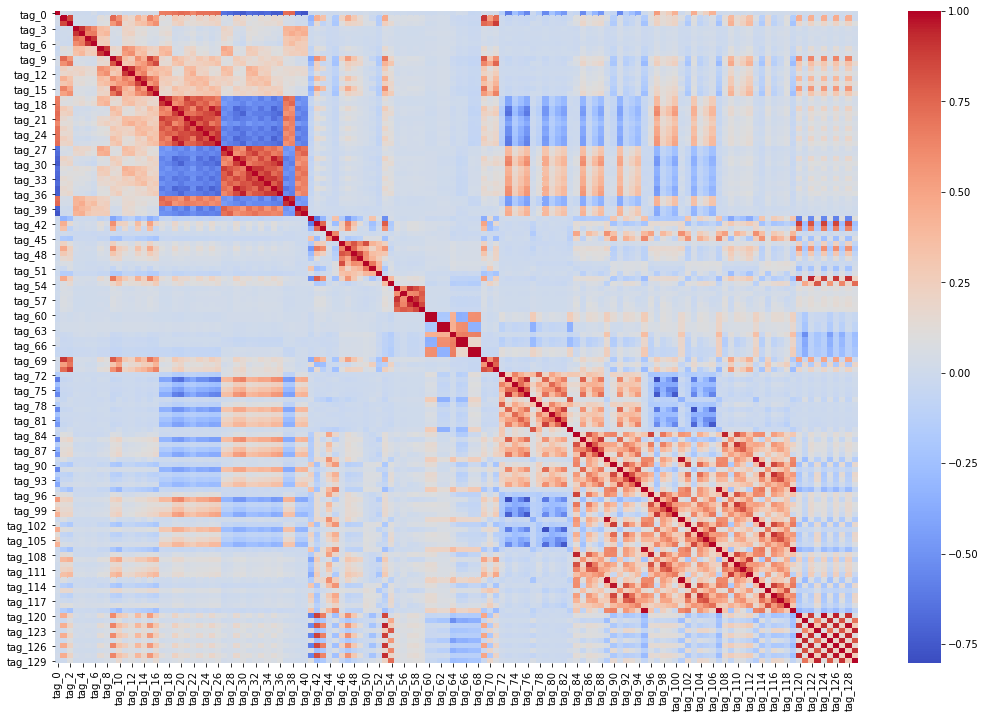

In [34]:
# Heat map 
fig = plt.figure(figsize=(18,12))
ax = plt.subplot(1,1,1)
sns.heatmap(tag_df.corr(),ax= ax, cmap='coolwarm');

There are cluster of features that are strongly correlated and we will investigated if it's necessary to keep all of them. 

<AxesSubplot:>

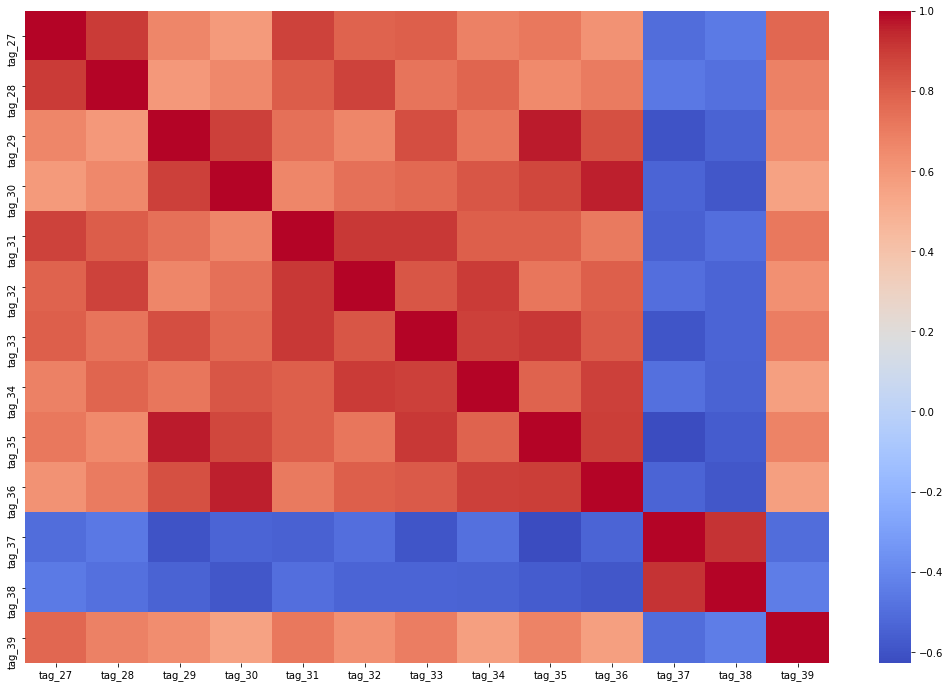

In [35]:
# Heat map  focused on segement of above plot
fig = plt.figure(figsize=(18,12))
ax = plt.subplot(1,1,1)
sns.heatmap(tag_df.iloc[:,27:40].corr(),ax= ax, cmap='coolwarm')

The above isolates a block of the entire heat map and shows the high correlation between adjacent predictors. We may benefit from using dimension reduction techniques, but for this analysis I am going to let the algorithm use all the variables and take care of these issues through regularization.

In [36]:
clean_train_data.head()

,date,weight,return_4,return,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,...,tag_123,tag_124,tag_125,tag_126,tag_127,tag_128,tag_129,ts_id,action,return_on_trade
479,0,1.887768,0.018192,0.020704,1,0.086238,-1.370409,-0.796239,-0.344834,-1.152042,...,-1.237860,1.610215,0.931161,2.236798,0.563850,1.023031,-0.635663,479,1,0.039084
480,0,0.993648,-0.021067,-0.019047,-1,2.540471,1.213258,-1.147064,-0.659254,-1.125747,...,0.169149,3.513960,1.320900,3.726736,0.085196,3.322019,0.044636,480,0,-0.018926
481,0,0.000000,-0.007114,-0.000713,1,-1.501931,-1.929721,-0.361945,-0.255800,-0.310175,...,1.799423,-0.388679,2.653866,-0.716593,1.731266,-0.734133,1.272144,481,0,-0.000000
482,0,0.000000,-0.006225,-0.005408,-1,-2.538125,-2.556376,0.801106,0.571915,-0.419473,...,3.463442,-0.083233,6.330656,-0.435629,4.287275,-0.594022,3.314273,482,0,-0.000000
483,0,3.942676,0.000034,-0.000294,-1,-2.425002,-2.544622,0.369648,0.150894,-0.293128,...,2.895219,0.441397,3.658603,0.552314,2.694183,0.781045,2.948364,483,0,-0.001158


## Model

In [37]:
print('Starting XGBC')

Starting XGBC


In [39]:
# Lets' work with this data
# lets build a XGBoost model to predict 'Target' using these features
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold

X, Y = tag_df,  clean_train_data['action']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25)

#define classifier and accept the defaults for now:
xgbc = XGBClassifier()
xgbc.fit(X_train, Y_train)


print(X_train.shape, Y_train.shape)
#del df
#del X, Y
#define classifier and accept the defaults for now:
#gc.collect()
xgbc = XGBClassifier(n_estimators = 100, max_depth = 12, min_child_weight = 1, learning_rate = 0.05, 
                    objective = 'multi:softmax', num_class = 2)
print(xgbc)
xgbc.fit(X_train, Y_train)


scores = cross_val_score(xgbc, X_train, Y_train, cv=5)
print("Mean cross-validation score: %.2f" % scores.mean())

 
print('Starting K-fold')
kfold = KFold(n_splits=5, shuffle=True)
kf_cv_scores = cross_val_score(xgbc, X_train, Y_train, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())


Y_pred = xgbc.predict(X_test)
cm = confusion_matrix(Y_test,Y_pred)
print(cm)

#gc.collect()



[10:26:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
(1495029, 130) (1495029,)
XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=0.05, max_delta_step=None, max_depth=12,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_class=2,
              num_parallel_tree=None, objective='multi:softmax',
              random_state=None, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=None, tree_method=None,
              validate_parameters=None,

KeyboardInterrupt: 

            
|   |  Yes | No  |   
|---|---|---|
|Predicted Yes  |   |   | 
|Predicted No  |   |   | 


In [ ]:
print("Execution time: %s seconds " % (time.time() - start_time))